In [1]:
# Basic and plotting packages
suppressMessages( library(kableExtra) )
suppressMessages( library(ggplot2) )
suppressMessages( library(cowplot) )
suppressMessages( library(latex2exp) )
t = theme(plot.title = element_text(size=26, hjust=0.5),
          axis.title = element_text(size=20),
          axis.text = element_text(size=16),
          legend.title = element_text(size = 20),
          legend.text = element_text(size = 16),
          plot.subtitle = element_text(size = 18, face="bold"))
theme_set(theme_minimal()+t)
options(repr.plot.width=16, repr.plot.height=6)

# Utils packages
suppressMessages( library(dplyr) ) # Pipeline
suppressMessages( library(snow) ) # Parallel apply, sapply, lapply
suppressMessages( library(pbapply) ) # Progressbar apply, sapply, lapply
suppressMessages( library(pbmcapply) ) # Progress bar in for loop (needs to be installed manually: https://cran.r-project.org/web/packages/pbmcapply/index.html)

suppressMessages( library(TSA) )
suppressMessages( library(rugarch) )

suppressMessages( library(mvtnorm) )
suppressMessages( library(tmvmixnorm) )
suppressMessages( library(truncnorm) )

# Integrate R with C++
suppressMessages( library(Rcpp) )
# Compile the c++ codes
Sys.setenv(PKG_LIBS = "-lmpfr -lgmp -lquadmath")
sourceCpp("divergence_parallel.cpp")
Sys.setenv(PKG_LIBS = "-lmpfr -lgmp -lquadmath")
sourceCpp("multifloat_precision_eigen.cpp")

# Load Simulation Files

In [2]:
files <- paste0("Final Simulations/", c("sim1.1.RData", "sim1.2.RData", "sim1.3.RData", "sim1.4.RData", "sim1.5.RData",
                                        "sim1.6.RData", "sim1.7.RData", "sim1.8.RData", "sim1.9.RData", "sim1.10.RData",
                                        "sim2.1.RData", "sim2.2.RData", "sim2.3.RData", "sim2.4.RData", "sim2.5.RData",
                                        "sim2.6.RData", "sim2.7.RData", "sim2.8.RData", "sim2.9.RData", "sim2.10.RData",
                                        "sim3.1.RData", "sim3.2.RData", "sim3.3.RData", "sim3.4.RData", "sim3.5.RData",
                                        "sim3.6.RData", "sim3.7.RData", "sim3.8.RData", "sim3.9.RData", "sim3.10.RData"))
for(file in files){
    load(file)
}

In [3]:
# Given a table of divergence metrics, take the maximum for each column
get_max_div <- function(div_table){
    apply(div_table, 2, max)
}

# Given a list of divergence tables, take the maximum in each column and join them in the same table
list_max_div <- function(div_tables){
    max_table <- sapply(div_tables, function(div_table){
        get_max_div(div_table)
    })
    col_names <- rownames(max_table)
    max_table <- t(max_table)
    colnames(max_table) <- col_names
    max_table
}

In [4]:
max_div <- list_max_div(sim1.1_1000$divergences)
max_div_KL <- max_div[,1]
max_div_KL_rev <- max_div[,2]
max_div_J <- max_div[,3]
max_div_chi2 <- max_div[,4]
max_div_chi2_rev <- max_div[,5]
max_div_chi2_sym <- max_div[,6]
max_div_L1 <- max_div[,7]
max_div_H <- max_div[,8]
max_div_JS <- max_div[,9]

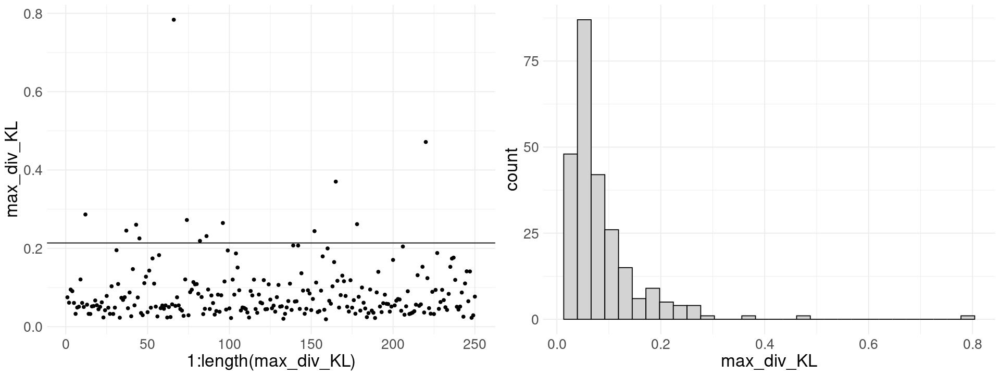

In [5]:
scatter_max_div <- ggplot()+
    geom_point(aes(x = 1:length(max_div_KL), y = max_div_KL))+
    geom_hline(aes(yintercept = quantile(max_div_KL, 0.95)))
hist_max_div <- ggplot()+
    geom_histogram(aes(x = max_div_KL), bins = 30, color = "black", fill = "lightgray")
plot_grid(scatter_max_div, hist_max_div)

In [6]:
suppressMessages( library(extRemes) )

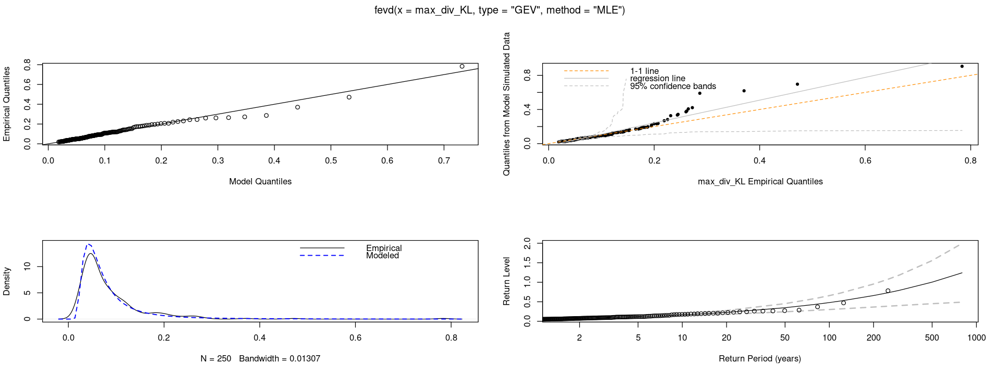

In [7]:
fit <- fevd(max_div_KL, type = "GEV", method = "MLE")
plot(fit)

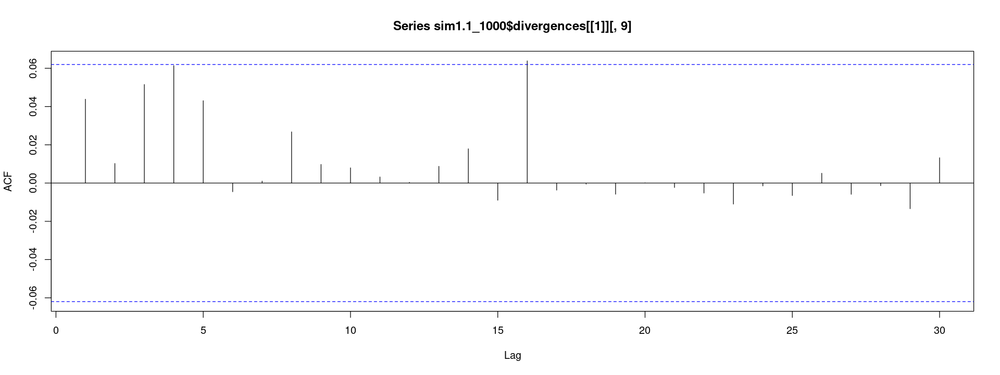

In [8]:
acf(sim1.1_1000$divergences[[1]][,9])

# GEV parameters regression

In [9]:
suppressMessages( library(plotly) )

In [10]:
max_div1.1 <- list_max_div(sim1.1_1000$divergences)
max_div1.2 <- list_max_div(sim1.2_1000$divergences)
max_div1.3 <- list_max_div(sim1.3_1000$divergences)
max_div1.4 <- list_max_div(sim1.4_1000$divergences)
max_div1.5 <- list_max_div(sim1.5_1000$divergences)
max_div1.6 <- list_max_div(sim1.6_1000$divergences)
max_div1.7 <- list_max_div(sim1.7_1000$divergences)
max_div1.8 <- list_max_div(sim1.8_1000$divergences)
max_div1.9 <- list_max_div(sim1.9_1000$divergences)
max_div1.10 <- list_max_div(sim1.10_1000$divergences)

max_div2.1 <- list_max_div(sim2.1_1000$divergences)
max_div2.2 <- list_max_div(sim2.2_1000$divergences)
max_div2.3 <- list_max_div(sim2.3_1000$divergences)
max_div2.4 <- list_max_div(sim2.4_1000$divergences)
max_div2.5 <- list_max_div(sim2.5_1000$divergences)
max_div2.6 <- list_max_div(sim2.6_1000$divergences)
max_div2.7 <- list_max_div(sim2.7_1000$divergences)
max_div2.8 <- list_max_div(sim2.8_1000$divergences)
max_div2.9 <- list_max_div(sim2.9_1000$divergences)
max_div2.10 <- list_max_div(sim2.10_1000$divergences)

max_div3.1 <- list_max_div(sim3.1_1000$divergences)
max_div3.2 <- list_max_div(sim3.2_1000$divergences)
max_div3.3 <- list_max_div(sim3.3_1000$divergences)
max_div3.4 <- list_max_div(sim3.4_1000$divergences)
max_div3.5 <- list_max_div(sim3.5_1000$divergences)
max_div3.6 <- list_max_div(sim3.6_1000$divergences)
max_div3.7 <- list_max_div(sim3.7_1000$divergences)
max_div3.8 <- list_max_div(sim3.8_1000$divergences)
max_div3.9 <- list_max_div(sim3.9_1000$divergences)
max_div3.10 <- list_max_div(sim3.10_1000$divergences)

cenarios <- as.list(c(rep("1", 10), rep("2", 10), rep("3", 10)))
sims <- list(sim1.1_1000, sim1.2_1000, sim1.3_1000, sim1.4_1000, sim1.5_1000, sim1.6_1000, sim1.7_1000, sim1.8_1000, sim1.9_1000, sim1.10_1000,
             sim2.1_1000, sim2.2_1000, sim2.3_1000, sim2.4_1000, sim2.5_1000, sim2.6_1000, sim2.7_1000, sim2.8_1000, sim2.9_1000, sim2.10_1000,
             sim3.1_1000, sim3.2_1000, sim3.3_1000, sim3.4_1000, sim3.5_1000, sim3.6_1000, sim3.7_1000, sim3.8_1000, sim3.9_1000, sim3.10_1000)
max_divs <- list(max_div1.1, max_div1.2, max_div1.3, max_div1.4, max_div1.5, max_div1.6, max_div1.7, max_div1.8, max_div1.9, max_div1.10,
                 max_div2.1, max_div2.2, max_div2.3, max_div2.4, max_div2.5, max_div2.6, max_div2.7, max_div2.8, max_div2.9, max_div2.10,
                 max_div3.1, max_div3.2, max_div3.3, max_div3.4, max_div3.5, max_div3.6, max_div3.7, max_div3.8, max_div3.9, max_div3.10)

extract_quantile_regression_data <- function(max_divs, sims){
    df <- data.frame()
    for(i in 1:length(max_divs)){
        name_index <- ifelse(i %% 10 == 0, i/10, floor(i/10)+1)
        name_cenario <- paste0(cenarios[[i]], ".", ifelse(i %% 10 == 0, 10, i %% 10) )
        pars <- data.frame(
            "index" = rep(name_index, nrow(max_divs[[i]])),
            "cenario" = rep(name_cenario, nrow(max_divs[[i]])),
            "alpha0" = rep(sims[[i]]$pars[1], nrow(max_divs[[i]])),
            "alpha1" = rep(sims[[i]]$pars[2], nrow(max_divs[[i]])),
            "beta" = rep(sims[[i]]$pars[3], nrow(max_divs[[i]]))
        )
        rows <- max_divs[[i]]
        rows <- cbind(pars, rows)
        df <- rbind(df, rows)
    }
    df
}

df_quantile_regression <- extract_quantile_regression_data(max_divs, sims)
head(df_quantile_regression, 3)
tail(df_quantile_regression, 3)

,index,cenario,alpha0,alpha1,beta,KL,KL_rev,J,chi2,chi2_rev,chi2_sym,L1,H,JS
,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,1.1,0.1,0.1,0.85,0.07496448,0.07554994,0.1505144,0.1630854,0.1594231,0.3225085,0.1558652,0.01865416,0.01849880
2,1,1.1,0.1,0.1,0.85,0.06130006,0.06387213,0.1251722,0.1428698,0.1253022,0.2681720,0.1392388,0.01551480,0.01538767
3,1,1.1,0.1,0.1,0.85,0.09477106,0.09874669,0.1935177,0.2354737,0.1991851,0.4268130,0.1736807,0.02390047,0.02362407


,index,cenario,alpha0,alpha1,beta,KL,KL_rev,J,chi2,chi2_rev,chi2_sym,L1,H,JS
,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
7498,3,3.10,2,0.85,0.1,0.4828138,0.9007839,1.3835977,11.7627757,1.152477,12.691202,0.4034975,0.14789046,0.13286008
7499,3,3.10,2,0.85,0.1,0.2099803,0.2405120,0.4247585,0.9434493,0.542955,1.298746,0.2520259,0.05071751,0.04906444
7500,3,3.10,2,0.85,0.1,0.5102808,0.4284456,0.9387264,1.0923198,2.509130,3.601450,0.3695586,0.10987927,0.10410310


In [11]:
df_quantile_regression[df_quantile_regression$index == 1,] %>% head(3)
df_quantile_regression[df_quantile_regression$index == 2,] %>% head(3)
df_quantile_regression[df_quantile_regression$index == 3,] %>% head(3)

,index,cenario,alpha0,alpha1,beta,KL,KL_rev,J,chi2,chi2_rev,chi2_sym,L1,H,JS
,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,1.1,0.1,0.1,0.85,0.07496448,0.07554994,0.1505144,0.1630854,0.1594231,0.3225085,0.1558652,0.01865416,0.01849880
2,1,1.1,0.1,0.1,0.85,0.06130006,0.06387213,0.1251722,0.1428698,0.1253022,0.2681720,0.1392388,0.01551480,0.01538767
3,1,1.1,0.1,0.1,0.85,0.09477106,0.09874669,0.1935177,0.2354737,0.1991851,0.4268130,0.1736807,0.02390047,0.02362407


,index,cenario,alpha0,alpha1,beta,KL,KL_rev,J,chi2,chi2_rev,chi2_sym,L1,H,JS
,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2501,2,2.1,1,0.1,0.85,0.07496448,0.07554994,0.1505144,0.1630854,0.1594231,0.3225085,0.1558652,0.01865416,0.01849880
2502,2,2.1,1,0.1,0.85,0.06130006,0.06387213,0.1251722,0.1428698,0.1253022,0.2681720,0.1392388,0.01551480,0.01538767
2503,2,2.1,1,0.1,0.85,0.09477106,0.09874669,0.1935177,0.2354737,0.1991851,0.4268130,0.1736807,0.02390047,0.02362407


,index,cenario,alpha0,alpha1,beta,KL,KL_rev,J,chi2,chi2_rev,chi2_sym,L1,H,JS
,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5001,3,3.1,2,0.1,0.85,0.07496448,0.07554994,0.1505144,0.1630854,0.1594231,0.3225085,0.1558652,0.01865416,0.01849880
5002,3,3.1,2,0.1,0.85,0.06130006,0.06387213,0.1251722,0.1428698,0.1253022,0.2681720,0.1392388,0.01551480,0.01538767
5003,3,3.1,2,0.1,0.85,0.09477106,0.09874669,0.1935177,0.2354737,0.1991851,0.4268130,0.1736807,0.02390047,0.02362407


In [12]:
div_metric <- "KL"

# Fixes a specific value for alpha_0
df_plot <- df_quantile_regression[df_quantile_regression$alpha0 == 0.1,]
fig_alpha0_1 <- plot_ly(df_plot, x = ~alpha1, y = ~beta, z = as.formula(paste0("~", div_metric)), scene='scene1', name = "alpha0 = 0.1")
fig_alpha0_1 <- fig_alpha0_1 %>% add_markers()
fig_alpha0_1 <- fig_alpha0_1 %>% layout(scene = list(xaxis = list(title = "alpha1"),
                     yaxis = list(title = 'beta'),
                     zaxis = list(title = 'max D_psi')))

df_plot <- df_quantile_regression[df_quantile_regression$alpha0 == 1,]
fig_alpha0_2 <- plot_ly(df_plot, x = ~alpha1, y = ~beta, z = as.formula(paste0("~", div_metric)), scene='scene2', name = "alpha0 = 1")
fig_alpha0_2 <- fig_alpha0_2 %>% add_markers()
fig_alpha0_2 <- fig_alpha0_2 %>% layout(scene = list(xaxis = list(title = "alpha1"),
                     yaxis = list(title = 'beta'),
                     zaxis = list(title = 'max D_psi')))

df_plot <- df_quantile_regression[df_quantile_regression$alpha0 == 2,]
fig_alpha0_3 <- plot_ly(df_plot, x = ~alpha1, y = ~beta, z = as.formula(paste0("~", div_metric)), scene='scene3', name = "alpha0 = 2")
fig_alpha0_3 <- fig_alpha0_3 %>% add_markers()
fig_alpha0_3 <- fig_alpha0_3 %>% layout(scene = list(xaxis = list(title = "alpha1"),
                     yaxis = list(title = 'beta'),
                     zaxis = list(title = 'max D_psi')))

options(warn = -1)
fig <- subplot(fig_alpha0_1, fig_alpha0_2, fig_alpha0_3)
fig <- fig %>% layout(title = "3D Subplots",
         scene = list(xaxis = list(title = "alpha1"), yaxis = list(title = "beta"), aspectmode='cube'),
         scene2 = list(xaxis = list(title = "alpha1"), yaxis = list(title = "beta"), aspectmode='cube'),
         scene3 = list(xaxis = list(title = "alpha1"), yaxis = list(title = "beta"), aspectmode='cube'))
fig
options(warn = 0)

HTML widgets cannot be represented in plain text (need html)

# GEV parameters regression as a function of $\alpha_1$ and $\beta$

In [13]:
suppressMessages( library(VGAM) )

## Estimating the GEV parameters directly from the VGLM model

In [14]:
# Model considering alpha0, alpha1 and beta
gev_pars_fit <- vglm(L1 ~ alpha0 + alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
S <- summary(gev_pars_fit)
S


Call:
vglm(formula = L1 ~ alpha0 + alpha1 + beta, family = gev(llocation = "identitylink", 
    lscale = "loglink", lshape = "identitylink", zero = NULL), 
    data = df_quantile_regression, maxit = 100)

Coefficients: 
                Estimate Std. Error  z value Pr(>|z|)    
(Intercept):1  0.1414191  0.0019032   74.306  < 2e-16 ***
(Intercept):2 -3.3205653  0.0319012 -104.089  < 2e-16 ***
(Intercept):3  0.1356109  0.0282697    4.797 1.61e-06 ***
alpha0:1      -0.0001445  0.0007990   -0.181   0.8565    
alpha0:2       0.0010250  0.0124537    0.082   0.9344    
alpha0:3      -0.0020309  0.0110438   -0.184   0.8541    
alpha1:1       0.1546327  0.0038533   40.130  < 2e-16 ***
alpha1:2       1.4722201  0.0447011   32.935  < 2e-16 ***
alpha1:3      -0.0789540  0.0395203   -1.998   0.0457 *  
beta:1        -0.0330526  0.0025003  -13.220  < 2e-16 ***
beta:2        -0.2285415  0.0452755   -5.048 4.47e-07 ***
beta:3        -0.0096347  0.0401128   -0.240   0.8102    
---
Signif. codes:  0 ‘**

In [15]:
aux <- round(S@coef3, 4)
rownames(aux) <- c()
aux[,3] <- paste0("(", round(confintvglm(gev_pars_fit)[,1],4), ", ", round(confintvglm(gev_pars_fit)[,2],4), ")")

## Removing the parameter $\alpha_0$ completely

In [16]:
options(warn = -1)
# Model considering only alpha1 and beta
gev_pars_fit_KL <- vglm(KL ~ alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
gev_pars_fit_KL_rev <- vglm(KL_rev ~ alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit  = 100)
gev_pars_fit_J <- vglm(J ~ alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
gev_pars_fit_L1 <- vglm(L1 ~ alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
gev_pars_fit_H <- vglm(H ~ alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
gev_pars_fit_JS <- vglm(JS ~ alpha1 + beta,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
S_KL <- summary(gev_pars_fit_KL)
S_KL_rev <- summary(gev_pars_fit_KL_rev)
S_J <- summary(gev_pars_fit_J)
S_L1 <- summary(gev_pars_fit_L1)
S_H <- summary(gev_pars_fit_H)
S_JS <- summary(gev_pars_fit_JS)
options(warn = 0)

In [17]:
location_hat <- function(alpha1, beta, fit){
    Coef(fit)[1] + Coef(fit)[4] * alpha1 + Coef(fit)[7] * beta
}
scale_hat <- function(alpha1, beta, fit){
    exp( Coef(fit)[2] + Coef(fit)[5] * alpha1 + Coef(fit)[8] * beta )
}
shape_hat <- function(alpha1, beta, fit){
    Coef(fit)[3] + Coef(fit)[6] * alpha1 + Coef(fit)[9] * beta
}
quantile_hat <- function(alpha1, beta, fit, q){
    location <- location_hat(alpha1, beta, fit)
    scale <- scale_hat(alpha1, beta, fit)
    shape <- shape_hat(alpha1, beta, fit)
    qgev(q, location = location, scale = scale, shape = shape)
}

In [18]:
S_J


Call:
vglm(formula = J ~ alpha1 + beta, family = gev(llocation = "identitylink", 
    lscale = "loglink", lshape = "identitylink", zero = NULL), 
    data = df_quantile_regression, maxit = 100)

Coefficients: 
               Estimate Std. Error z value Pr(>|z|)    
(Intercept):1  0.130000   0.003254  39.953  < 2e-16 ***
(Intercept):2 -2.729726   0.033321 -81.922  < 2e-16 ***
(Intercept):3  0.364752   0.031248  11.673  < 2e-16 ***
alpha1:1       0.295154   0.008712  33.878  < 2e-16 ***
alpha1:2       2.330840   0.050106  46.518  < 2e-16 ***
alpha1:3       0.237739   0.049819   4.772 1.82e-06 ***
beta:1        -0.061106   0.004558 -13.407  < 2e-16 ***
beta:2        -0.403289   0.051471  -7.835 4.68e-15 ***
beta:3        -0.029565   0.048299  -0.612     0.54    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Names of linear predictors: location, loglink(scale), shape

Log-likelihood: 1394.176 on 22491 degrees of freedom

Number of Fisher scoring iterations: 44 

No H

In [19]:
round(S_JS@coef3, 4)

,Estimate,Std. Error,z value,Pr(>|z|)
(Intercept):1,0.0159,0.0004,40.7241,0.0000
(Intercept):2,-4.8503,0.0330,-146.9812,0.0000
(Intercept):3,0.3671,0.0306,11.9998,0.0000
alpha1:1,0.0364,0.0010,34.8972,0.0000
alpha1:2,2.2698,0.0493,46.0019,0.0000
alpha1:3,0.0283,0.0474,0.5967,0.5507
beta:1,-0.0074,0.0005,-13.5930,0.0000
beta:2,-0.3942,0.0510,-7.7290,0.0000
beta:3,-0.0197,0.0474,-0.4149,0.6782


In [20]:
library(plot3D)

In [21]:
q <- 0.95
Malpha1 <- seq(0.01, 0.99, length.out = 100)
Mbeta <- seq(0.01, 0.99, length.out = 100)

Malpha1beta <- expand.grid(Malpha1, Mbeta)
Mq <- t( outer(Malpha1, Mbeta, function(alpha1, beta){ quantile_hat(alpha1, beta, gev_pars_fit_KL, q) }) )

fig <- plot_ly(x = Malpha1, y = Mbeta, z = ~Mq)
fig <- fig %>% add_surface()                     
fig <- fig %>% add_trace(x = ~alpha1, y = ~beta, z = ~KL, data = df_quantile_regression, type = "scatter3d", mode = "markers")
fig <- fig %>% layout(scene = list(xaxis = list(title = "alpha1"),
                                   yaxis = list(title = 'beta'),
                                   zaxis = list(title = 'max D_psi')))
fig

HTML widgets cannot be represented in plain text (need html)

In [22]:
q <- 0.95
Malpha1 <- seq(0.01, 0.99, length.out = 20)
Mbeta <- seq(0.01, 0.99, length.out = 20)

Malpha1beta <- mesh(Malpha1, Mbeta)
Malpha1 <- Malpha1beta$x
Mbeta <- Malpha1beta$y

Mq_KL <- quantile_hat(Malpha1, Mbeta, gev_pars_fit_KL, q)
Mq_KL[Malpha1 + Mbeta > 1] <- NA

Mq_L1 <- quantile_hat(Malpha1, Mbeta, gev_pars_fit_L1, q)
Mq_L1[Malpha1 + Mbeta > 1] <- NA

Mq_JS <- quantile_hat(Malpha1, Mbeta, gev_pars_fit_JS, q)
Mq_JS[Malpha1 + Mbeta > 1] <- NA


png(filename = "persp3D_plot.png", width = 2000, height = 1000)  # Dimensions in pixels

par(mfrow = c(1, 3), pty = "s", mar=c(0,0,0,0))

scatter3D(df_quantile_regression$alpha1, df_quantile_regression$beta, df_quantile_regression$KL,
          phi = 5, theta=-30,
          pch = 16, cex = 1, col = "black",
          xlab = "", ylab="", zlab="", main="(a)", xlim = c(0,1), ylim = c(0,1),
          ticktype = "detailed", cex.main = 4, cex.axis = 3)
persp3D(Malpha1, Mbeta, Mq_KL, bty = 'b', border = 'black', col=0, add = TRUE)
text3D(0.4, -0.2, -0.3, labels = latex2exp::TeX("$\\alpha_1$"), add = TRUE, cex = 4)
text3D(-0.2, 0.3, 0.2, labels = latex2exp::TeX("$\\beta$"), add = TRUE, cex = 4)

scatter3D(df_quantile_regression$alpha1, df_quantile_regression$beta, df_quantile_regression$L1,
          phi = 5, theta=-30,
          pch = 16, cex = 1, col = "black",
          xlab = "", ylab="", zlab="", main="(b)", xlim = c(0,1), ylim = c(0,1),
          ticktype = "detailed", cex.main = 4, cex.axis = 3)
persp3D(Malpha1, Mbeta, Mq_L1, bty = 'b', border = 'black', col=0, add = TRUE)
text3D(0.4, -0.2, 0.03, labels = latex2exp::TeX("$\\alpha_1$"), add = TRUE, cex = 4)
text3D(-0.19, 0.3, 0.07, labels = latex2exp::TeX("$\\beta$"), add = TRUE, cex = 4)

text3D(0, 0, 0, labels = "", add = TRUE, size = 22)

scatter3D(df_quantile_regression$alpha1, df_quantile_regression$beta, df_quantile_regression$JS,
          phi = 5, theta=-30,
          pch = 16, cex = 1, col = "black",
          xlab = "", ylab="", zlab="", main="(c)", xlim = c(0,1), ylim = c(0,1),
          ticktype = "detailed", cex.main = 4, cex.axis = 3)
persp3D(Malpha1, Mbeta, Mq_JS, bty = 'b', border = 'black', col=0, add = TRUE)
text3D(0.4, -0.2, -0.02, labels = latex2exp::TeX("$\\alpha_1$"), add = TRUE, cex = 4)
text3D(-0.19, 0.3, 0.01, labels = latex2exp::TeX("$\\beta$"), add = TRUE, cex = 4)

dev.off()

pdf 
  2

In [23]:
# Plots the histogram alongside the preditive density using the parameters estimate from the GEV regression
plot_model_distribution <- function(fit, metric, scenario = 1, q = 0.95){
    df_scenario = df_quantile_regression[df_quantile_regression$cenario == scenario,]
    ggplot()+
        geom_histogram(aes(x = df_scenario[,metric], y = after_stat(density)), color = "black", bins = 50)+
        stat_function(fun = dgev, args = list(location = location_hat(df_scenario$alpha1[1], df_scenario$beta[1], fit),
                                              scale = scale_hat(df_scenario$alpha1[1], df_scenario$beta[1], fit),
                                              shape = shape_hat(df_scenario$alpha1[1], df_scenario$beta[1], fit)
                                             ), n = 500, linewidth = 1.1, color = "red")+
        geom_vline(aes(xintercept = quantile_hat(df_scenario$alpha1[1], df_scenario$beta[1], fit, q)), color = "red", linewidth = 1.1)
}

# Modelagem Geral

Uma vez comprovado que conseguimos obter os quantis das divergências de maneira relativamente direta, nos resta apenas estender o modelo para possibilitar todas as métricas envolvidas.

In [24]:
divergence_metrics <- c("KL", "KL_rev", "J", "L1", "H", "JS")

divergence_models <- list()
for(metric in divergence_metrics){   
    form <- as.formula(paste0(metric, " ~ alpha1 + beta"))
    print(form)
    gev_pars_fit_model <- vglm(form,
                     family = gev(llocation = "identitylink", lscale = "loglink", lshape = "identitylink", zero = NULL),
                     data = df_quantile_regression, maxit = 100)
    divergence_models[[metric]] <- gev_pars_fit_model
}

KL ~ alpha1 + beta
KL_rev ~ alpha1 + beta
J ~ alpha1 + beta
L1 ~ alpha1 + beta
H ~ alpha1 + beta
JS ~ alpha1 + beta


In [25]:
# plot_model_distribution_all_scenarios(divergence_models$L1, "L1", q = 0.95, title = "Distribution for the maxima of L1 divergence")

In [26]:
div_quantiles_KL <- quantile_hat(df_quantile_regression$alpha1, df_quantile_regression$beta, divergence_models$KL, 0.95)
div_quantiles_KL_rev <- quantile_hat(df_quantile_regression$alpha1, df_quantile_regression$beta, divergence_models$KL_rev, 0.95)
div_quantiles_J <- quantile_hat(df_quantile_regression$alpha1, df_quantile_regression$beta, divergence_models$J, 0.95)
div_quantiles_L1 <- quantile_hat(df_quantile_regression$alpha1, df_quantile_regression$beta, divergence_models$L1, 0.95)
div_quantiles_H <- quantile_hat(df_quantile_regression$alpha1, df_quantile_regression$beta, divergence_models$H, 0.95)
div_quantiles_JS <- quantile_hat(df_quantile_regression$alpha1, df_quantile_regression$beta, divergence_models$JS, 0.95)

cat("Proportion of errors type I Divergence KL: ", (df_quantile_regression$KL > div_quantiles_KL) %>% mean, "\n")
cat("Proportion of errors type I Divergence KL_rev: ", (df_quantile_regression$KL_rev > div_quantiles_KL_rev) %>% mean, "\n")
cat("Proportion of errors type I Divergence J: ", (df_quantile_regression$J > div_quantiles_J) %>% mean, "\n")
cat("Proportion of errors type I Divergence L1: ", (df_quantile_regression$L1 > div_quantiles_L1) %>% mean, "\n")
cat("Proportion of errors type I Divergence H: ", (df_quantile_regression$H > div_quantiles_H) %>% mean, "\n")
cat("Proportion of errors type I Divergence JS: ", (df_quantile_regression$JS > div_quantiles_JS) %>% mean, "\n")

Proportion of errors type I Divergence KL:  0.05226667 
Proportion of errors type I Divergence KL_rev:  0.05346667 
Proportion of errors type I Divergence J:  0.05306667 
Proportion of errors type I Divergence L1:  0.05306667 
Proportion of errors type I Divergence H:  0.0536 
Proportion of errors type I Divergence JS:  0.0532 


## Aplication for the cut points obtained in the simulations

In [27]:
# Sampler for the GARCH(1,1)
sample_garch <- function(T, alpha0, alpha1, beta){
    h <- alpha0
    y <- rnorm(1, 0, sqrt(h))
    for(t in 2:T){
        h[t] <- alpha0 + alpha1 * y[t-1]^2 + beta * h[t-1]
        y[t] <- rnorm(1, 0, sqrt(h[t]))
    }
    return(list(y = y, h = h))
}

# Retrieves the MLE for the GARCH(1,1)
garch_emv <- function(y, alpha0, beta0){
    theta0 <- c(alpha0, beta0)
    log_lik <- function(theta, y){
        alpha <- theta[1:2]
        beta <- theta[3]
        ell <- log_likelihood_garch_cpp(alpha, beta, y)
        return(ell)
    }
    BFGS_model <- optim(theta0, log_lik, method="L-BFGS-B", hessian=TRUE, control=list(fnscale=-1),
                        lower=c(0.0001,0.0001,0.0001), upper=c(Inf, Inf, Inf), y=y)
    return(BFGS_model)
}

In [28]:
fit_garch_ardia <- function(y, niter = 10000, burnin = 5000, seed = 42, emv_guess = c(0.5, 0.5, 0.5)){    
    T = length(y)
    
    alpha_guess <- emv_guess[1:2]
    beta_guess <- emv_guess[3]
    emv <- garch_emv(y, alpha0 = alpha_guess, beta0 = beta_guess)
    alpha0_emv <- emv$par[1]
    alpha1_emv <- emv$par[2]
    beta_emv <- emv$par[3]
    
    # -------------------------------- Initial chain values --------------------------------
    alpha0 <- c(alpha0_emv, alpha1_emv)
    beta0 <- beta_emv
    
    # -------------------------------- Fit the Bayesian model --------------------------------
    sample_alpha_beta <- sample_posterior_garch_cpp(y, niter, alpha0, beta0)
    
    # -------------------------------- Extract the posterior distribution samples --------------------------------
    sample_alpha0 <- sample_alpha_beta$alpha[,1]
    sample_alpha1 <- sample_alpha_beta$alpha[,2]
    sample_beta <- sample_alpha_beta$beta
    sample_h <- sample_alpha_beta$h
    
    # -------------------------------- Samples with burnin already removed --------------------------------
    final_alpha0 <- sample_alpha0[(burnin+1):niter]
    final_alpha1 <- sample_alpha1[(burnin+1):niter]
    final_beta <- sample_beta[(burnin+1):niter]
    final_h <- sample_h[(burnin+1):niter,]
    
    shuffle_indexes <- sample(1:length(final_alpha0))
    final_alpha0 <- final_alpha0[shuffle_indexes]
    final_alpha1 <- final_alpha1[shuffle_indexes]
    final_beta <- final_beta[shuffle_indexes]
    final_h <- final_h[shuffle_indexes,]
    
    summ_colnames <- c("mean", "median", "sd", "2.5%", "25%", "50%", "75%", "97.5%")
    summ_rownames <- c("alpha0", "alpha1", "beta")
    summ <- data.frame(
        c(mean(final_alpha0), mean(final_alpha1), mean(final_beta)),
        c(median(final_alpha0), median(final_alpha1), median(final_beta)),
        c(sd(final_alpha0), sd(final_alpha1), sd(final_beta)),
        c(quantile(final_alpha0, 0.025), quantile(final_alpha1, 0.025), quantile(final_beta, 0.025)),
        c(quantile(final_alpha0, 0.25), quantile(final_alpha1, 0.25), quantile(final_beta, 0.25)),
        c(quantile(final_alpha0, 0.5), quantile(final_alpha1, 0.5), quantile(final_beta, 0.5)),
        c(quantile(final_alpha0, 0.75), quantile(final_alpha1, 0.75), quantile(final_beta, 0.75)),
        c(quantile(final_alpha0, 0.975), quantile(final_alpha1, 0.975), quantile(final_beta, 0.975))
    )
    colnames(summ) <- summ_colnames
    rownames(summ) <- summ_rownames
    
    list(
        "alpha0_complete" = sample_alpha0,
        "alpha1_complete" = sample_alpha1,
        "beta_complete" = sample_beta,
        "h_complete" = sample_h,
        "alpha0" = final_alpha0,
        "alpha1" = final_alpha1,
        "beta" = final_beta,
        "h" = final_h,
        "summary" = summ,
        "fit_chain" = sample_alpha_beta,
        "emv" = emv
    )
}

[1]  29 449 773

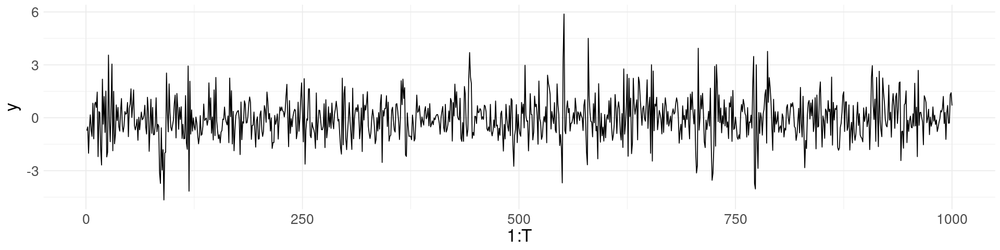

In [29]:
set.seed(1620)

is <- sample(1:1000, 3) %>% sort()
is

i1 <- is[1]
i2 <- is[2]
i3 <- is[3]

T <- 1000
yh <- sample_garch(T, 0.5, 0.4, 0.2)
y <- yh$y
h <- yh$h

y_a <- y
h_a <- h

options(repr.plot.width=16, repr.plot.height=4)
ggplot()+
    geom_line(aes(x = 1:T, y = y))

In [30]:
print_divs <- function(q_KL, q_KL_rev, q_J, q_L1, q_H, q_JS, div){
    div <- round(div, 4)
    cat("Threshold KL:", round(q_KL, 4), "\nValues:", div$KL[i1],",",div$KL[i2], ",", div$KL[i3], "\n\n")
    cat("Threshold KL_rev:", round(q_KL_rev, 4), "\nValues:", div$KL_rev[i1],",",div$KL_rev[i2] ,",", div$KL_rev[i3], "\n\n")
    cat("Threshold J:", round(q_J, 4), "\nValues:", div$J[i1],",",div$J[i2], ",", div$J[i3], "\n\n")
    cat("Threshold L1:", round(q_L1, 4), "\nValues:", div$L1[i1],",",div$L1[i2], ",", div$L1[i3], "\n\n")
    cat("Threshold H:", round(q_H, 4), "\nValues:", div$H[i1],",",div$H[i2],",",div$H[i3], "\n\n")
    cat("Threshold JS:", round(q_JS, 4), "\nValues:", div$JS[i1],",",div$JS[i2],"",div$JS[i3])
}

### (a) No perturbation

In [31]:
set.seed(1892)

start <- Sys.time()
    fit_y_a <- fit_garch_ardia(y_a, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_a$alpha0, fit_y_a$alpha1, fit_y_a$beta)
hs <- fit_y_a$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_a <- psi_divergences_cpp_parallel(thetas, hs, y_a, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_a) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_a <- as.data.frame(div_a)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.003386 
Time for the divergence metrics computation: 25.77708

In [32]:
q <- 0.8

q_y_KL_a <- quantile_hat(fit_y_a$alpha1, fit_y_a$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_a <- quantile_hat(fit_y_a$alpha1, fit_y_a$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_a <- quantile_hat(fit_y_a$alpha1, fit_y_a$beta, gev_pars_fit_J, q) %>% median
q_y_L1_a <- quantile_hat(fit_y_a$alpha1, fit_y_a$beta, gev_pars_fit_L1, q) %>% median
q_y_H_a <- quantile_hat(fit_y_a$alpha1, fit_y_a$beta, gev_pars_fit_H, q) %>% median
q_y_JS_a <- quantile_hat(fit_y_a$alpha1, fit_y_a$beta, gev_pars_fit_JS, q) %>% median

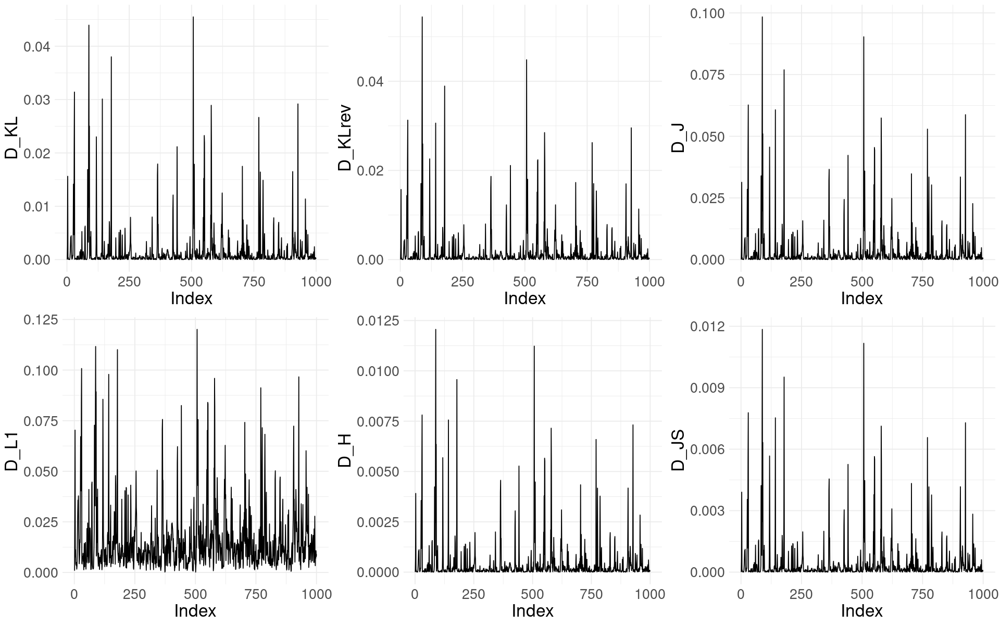

In [33]:
options(repr.plot.width=16, repr.plot.height=10)
g_KL <- ggplot()+
    geom_line(aes(x = 1:T, div_a$KL))+
    labs(x = "Index", y = "D_KL")
g_KL_rev <- ggplot()+
    geom_line(aes(x = 1:T, div_a$KL_rev))+
    labs(x = "Index", y = "D_KLrev")
g_J <- ggplot()+
    geom_line(aes(x = 1:T, div_a$J))+
    labs(x = "Index", y = "D_J")
g_L1 <- ggplot()+
    geom_line(aes(x = 1:T, div_a$L1))+
    labs(x = "Index", y = "D_L1")
g_H <- ggplot()+
    geom_line(aes(x = 1:T, div_a$H))+
    labs(x = "Index", y = "D_H")
g_JS <- ggplot()+
    geom_line(aes(x = 1:T, div_a$JS))+
    labs(x = "Index", y = "D_JS")

plot_grid(g_KL, g_KL_rev, g_J, g_L1, g_H, g_JS, nrow = 2)

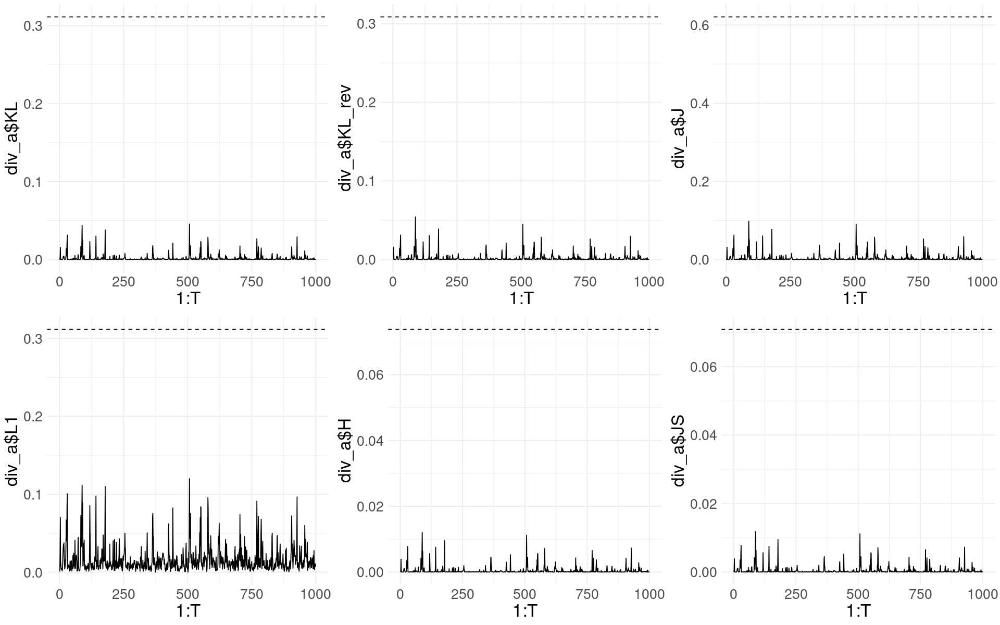

In [34]:
options(repr.plot.width=16, repr.plot.height=10)
g_KL <- ggplot()+
    geom_line(aes(x = 1:T, div_a$KL))+
    geom_hline(aes(yintercept = q_y_KL_a), linetype = "dashed")
g_KL_rev <- ggplot()+
    geom_line(aes(x = 1:T, div_a$KL_rev))+
    geom_hline(aes(yintercept = q_y_KL_rev_a), linetype = "dashed")
g_J <- ggplot()+
    geom_line(aes(x = 1:T, div_a$J))+
    geom_hline(aes(yintercept = q_y_J_a), linetype = "dashed")
g_L1 <- ggplot()+
    geom_line(aes(x = 1:T, div_a$L1))+
    geom_hline(aes(yintercept = q_y_L1_a), linetype = "dashed")
g_H <- ggplot()+
    geom_line(aes(x = 1:T, div_a$H))+
    geom_hline(aes(yintercept = q_y_H_a), linetype = "dashed")
g_JS <- ggplot()+
    geom_line(aes(x = 1:T, div_a$JS))+
    geom_hline(aes(yintercept = q_y_JS_a), linetype = "dashed")

plot_grid(g_KL, g_KL_rev, g_J, g_L1, g_H, g_JS, nrow = 2)

In [35]:
options(scipen=999)

In [36]:
print_divs(q_y_KL_a, q_y_KL_rev_a, q_y_J_a, q_y_L1_a, q_y_H_a, q_y_JS_a, div_a)

Threshold KL: 0.3112 
Values: 0.0218 , 0.0008 , 0.0002 

Threshold KL_rev: 0.3086 
Values: 0.0222 , 0.0008 , 0.0002 

Threshold J: 0.6207 
Values: 0.044 , 0.0016 , 0.0003 

Threshold L1: 0.3115 
Values: 0.0835 , 0.0161 , 0.0069 

Threshold H: 0.0738 
Values: 0.0055 , 0.0002 , 0 

Threshold JS: 0.0709 
Values: 0.0055 , 0.0002  0

### (b) Observation $i_1 = 29$ perturbed

In [37]:
y_b <- y_a
y_b[i1] <- y_a[i1] + sign(y_a[i1])*8*sqrt(h_a[i1])

set.seed(1892)

start <- Sys.time()
    fit_y_b <- fit_garch_ardia(y_b, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_b$alpha0, fit_y_b$alpha1, fit_y_b$beta)
hs <- fit_y_b$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_b <- psi_divergences_cpp_parallel(thetas, hs, y_b, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_b) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_b <- as.data.frame(div_b)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.014632 
Time for the divergence metrics computation: 25.63102

In [38]:
q <- 0.8

q_y_KL_b <- quantile_hat(fit_y_b$alpha1, fit_y_b$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_b <- quantile_hat(fit_y_b$alpha1, fit_y_b$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_b <- quantile_hat(fit_y_b$alpha1, fit_y_b$beta, gev_pars_fit_J, q) %>% median
q_y_L1_b <- quantile_hat(fit_y_b$alpha1, fit_y_b$beta, gev_pars_fit_L1, q) %>% median
q_y_H_b <- quantile_hat(fit_y_b$alpha1, fit_y_b$beta, gev_pars_fit_H, q) %>% median
q_y_JS_b <- quantile_hat(fit_y_b$alpha1, fit_y_b$beta, gev_pars_fit_JS, q) %>% median

In [39]:
print_divs(q_y_KL_b, q_y_KL_rev_b, q_y_J_b, q_y_L1_b, q_y_H_b, q_y_JS_b, div_b)

Threshold KL: 0.3073 
Values: 2.1539 , 0.001 , 0.0005 

Threshold KL_rev: 0.3026 
Values: 2.3755 , 0.001 , 0.0005 

Threshold J: 0.6105 
Values: 4.5295 , 0.0019 , 0.0009 

Threshold L1: 0.3086 
Values: 0.72 , 0.0175 , 0.0123 

Threshold H: 0.0726 
Values: 0.4394 , 0.0002 , 0.0001 

Threshold JS: 0.0697 
Values: 0.3718 , 0.0002  0.0001

### (c) Observation $i_2 = 449$ perturbed

In [40]:
y_c <- y_a
y_c[i2] <- y_a[i1] + sign(y_a[i2])*8*sqrt(h_a[i2])

set.seed(1892)

start <- Sys.time()
    fit_y_c <- fit_garch_ardia(y_c, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_c$alpha0, fit_y_c$alpha1, fit_y_c$beta)
hs <- fit_y_c$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_c <- psi_divergences_cpp_parallel(thetas, hs, y_c, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_c) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_c <- as.data.frame(div_c)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.010639 
Time for the divergence metrics computation: 25.36683

In [41]:
q <- 0.8

q_y_KL_c <- quantile_hat(fit_y_c$alpha1, fit_y_c$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_c <- quantile_hat(fit_y_c$alpha1, fit_y_c$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_c <- quantile_hat(fit_y_c$alpha1, fit_y_c$beta, gev_pars_fit_J, q) %>% median
q_y_L1_c <- quantile_hat(fit_y_c$alpha1, fit_y_c$beta, gev_pars_fit_L1, q) %>% median
q_y_H_c <- quantile_hat(fit_y_c$alpha1, fit_y_c$beta, gev_pars_fit_H, q) %>% median
q_y_JS_c <- quantile_hat(fit_y_c$alpha1, fit_y_c$beta, gev_pars_fit_JS, q) %>% median

In [42]:
print_divs(q_y_KL_c, q_y_KL_rev_c, q_y_J_c, q_y_L1_c, q_y_H_c, q_y_JS_c, div_c)

Threshold KL: 0.3322 
Values: 0.0374 , 1.3244 , 0.0005 

Threshold KL_rev: 0.3262 
Values: 0.0385 , 1.2487 , 0.0005 

Threshold J: 0.6591 
Values: 0.0759 , 2.573 , 0.0009 

Threshold L1: 0.3208 
Values: 0.1118 , 0.5793 , 0.0122 

Threshold H: 0.0781 
Values: 0.0094 , 0.2764 , 0.0001 

Threshold JS: 0.0749 
Values: 0.0094 , 0.2469  0.0001

### (d) Observation $i_3 = 773$ perturbed

In [43]:
y_d <- y_a
y_d[i3] <- y_a[i3] + sign(y_a[i3])*8*sqrt(h_a[i3])

set.seed(1892)

start <- Sys.time()
    fit_y_d <- fit_garch_ardia(y_d, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_d$alpha0, fit_y_d$alpha1, fit_y_d$beta)
hs <- fit_y_d$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_d <- psi_divergences_cpp_parallel(thetas, hs, y_d, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_d) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_d <- as.data.frame(div_d)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.035215 
Time for the divergence metrics computation: 25.40518

In [44]:
q <- 0.8

q_y_KL_d <- quantile_hat(fit_y_d$alpha1, fit_y_d$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_d <- quantile_hat(fit_y_d$alpha1, fit_y_d$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_d <- quantile_hat(fit_y_d$alpha1, fit_y_d$beta, gev_pars_fit_J, q) %>% median
q_y_L1_d <- quantile_hat(fit_y_d$alpha1, fit_y_d$beta, gev_pars_fit_L1, q) %>% median
q_y_H_d <- quantile_hat(fit_y_d$alpha1, fit_y_d$beta, gev_pars_fit_H, q) %>% median
q_y_JS_d <- quantile_hat(fit_y_d$alpha1, fit_y_d$beta, gev_pars_fit_JS, q) %>% median

In [45]:
print_divs(q_y_KL_d, q_y_KL_rev_d, q_y_J_d, q_y_L1_d, q_y_H_d, q_y_JS_d, div_d)

Threshold KL: 0.4852 
Values: 0.021 , 0.0009 , 4.4264 

Threshold KL_rev: 0.4566 
Values: 0.0211 , 0.0009 , 6.1867 

Threshold J: 0.9422 
Values: 0.0421 , 0.0019 , 10.6131 

Threshold L1: 0.3814 
Values: 0.0822 , 0.0174 , 0.9007 

Threshold H: 0.1094 
Values: 0.0052 , 0.0002 , 0.7453 

Threshold JS: 0.1035 
Values: 0.0052 , 0.0002  0.5672

### (e) Observations $i_1 = 29$ and $i_2 = 449$ perturbed

In [46]:
y_e <- y_a
y_e[i1] <- y_a[i1] + sign(y_a[i1])*8*sqrt(h_a[i1])
y_e[i2] <- y_a[i2] + sign(y_a[i2])*8*sqrt(h_a[i2])

set.seed(1892)

start <- Sys.time()
    fit_y_e <- fit_garch_ardia(y_e, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_e$alpha0, fit_y_e$alpha1, fit_y_e$beta)
hs <- fit_y_e$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_e <- psi_divergences_cpp_parallel(thetas, hs, y_e, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_e) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_e <- as.data.frame(div_e)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.011298 
Time for the divergence metrics computation: 25.73553

In [47]:
q <- 0.8

q_y_KL_e <- quantile_hat(fit_y_e$alpha1, fit_y_e$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_e <- quantile_hat(fit_y_e$alpha1, fit_y_e$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_e <- quantile_hat(fit_y_e$alpha1, fit_y_e$beta, gev_pars_fit_J, q) %>% median
q_y_L1_e <- quantile_hat(fit_y_e$alpha1, fit_y_e$beta, gev_pars_fit_L1, q) %>% median
q_y_H_e <- quantile_hat(fit_y_e$alpha1, fit_y_e$beta, gev_pars_fit_H, q) %>% median
q_y_JS_e <- quantile_hat(fit_y_e$alpha1, fit_y_e$beta, gev_pars_fit_JS, q) %>% median

In [48]:
print_divs(q_y_KL_e, q_y_KL_rev_e, q_y_J_e, q_y_L1_e, q_y_H_e, q_y_JS_e, div_e)

Threshold KL: 0.2886 
Values: 2.6182 , 1.1917 , 0.0009 

Threshold KL_rev: 0.2849 
Values: 4.8591 , 1.2042 , 0.001 

Threshold J: 0.5741 
Values: 7.4773 , 2.3959 , 0.0019 

Threshold L1: 0.2989 
Values: 0.8147 , 0.5614 , 0.0176 

Threshold H: 0.0684 
Values: 0.5925 , 0.2586 , 0.0002 

Threshold JS: 0.0658 
Values: 0.4702 , 0.2321  0.0002

### (f) Observations $i_1 = 29$ and $i_3 = 773$ perturbed

In [49]:
y_f <- y_a
y_f[i1] <- y_a[i1] + sign(y_a[i1])*8*sqrt(h_a[i1])
y_f[i3] <- y_a[i3] + sign(y_a[i3])*8*sqrt(h_a[i3])

set.seed(1892)

start <- Sys.time()
    fit_y_f <- fit_garch_ardia(y_f, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_f$alpha0, fit_y_f$alpha1, fit_y_f$beta)
hs <- fit_y_f$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_f <- psi_divergences_cpp_parallel(thetas, hs, y_f, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_f) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_f <- as.data.frame(div_f)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.027738 
Time for the divergence metrics computation: 25.79474

In [50]:
q <- 0.8

q_y_KL_f <- quantile_hat(fit_y_f$alpha1, fit_y_f$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_f <- quantile_hat(fit_y_f$alpha1, fit_y_f$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_f <- quantile_hat(fit_y_f$alpha1, fit_y_f$beta, gev_pars_fit_J, q) %>% median
q_y_L1_f <- quantile_hat(fit_y_f$alpha1, fit_y_f$beta, gev_pars_fit_L1, q) %>% median
q_y_H_f <- quantile_hat(fit_y_f$alpha1, fit_y_f$beta, gev_pars_fit_H, q) %>% median
q_y_JS_f <- quantile_hat(fit_y_f$alpha1, fit_y_f$beta, gev_pars_fit_JS, q) %>% median

In [51]:
print_divs(q_y_KL_f, q_y_KL_rev_f, q_y_J_f, q_y_L1_f, q_y_H_f, q_y_JS_f, div_f)

Threshold KL: 0.5195 
Values: 1.3285 , 0.0011 , 3.2666 

Threshold KL_rev: 0.4823 
Values: 1.214 , 0.0011 , 4.0756 

Threshold J: 1.002 
Values: 2.5425 , 0.0022 , 7.3422 

Threshold L1: 0.3923 
Values: 0.5787 , 0.0188 , 0.8263 

Threshold H: 0.1158 
Values: 0.2741 , 0.0003 , 0.6063 

Threshold JS: 0.1092 
Values: 0.2454 , 0.0003  0.4834

### (g) Observations $i_2 = 449$ and $i_3 = 773$ perturbed

In [52]:
y_g <- y_a
y_g[i2] <- y_a[i2] + sign(y_a[i2])*8*sqrt(h_a[i2])
y_g[i3] <- y_a[i3] + sign(y_a[i3])*8*sqrt(h_a[i3])

set.seed(1892)

start <- Sys.time()
    fit_y_g <- fit_garch_ardia(y_g, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_g$alpha0, fit_y_g$alpha1, fit_y_g$beta)
hs <- fit_y_g$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_g <- psi_divergences_cpp_parallel(thetas, hs, y_g, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_g) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_g <- as.data.frame(div_g)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 59.9221 
Time for the divergence metrics computation: 25.52054

In [53]:
q <- 0.8

q_y_KL_g <- quantile_hat(fit_y_g$alpha1, fit_y_g$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_g <- quantile_hat(fit_y_g$alpha1, fit_y_g$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_g <- quantile_hat(fit_y_g$alpha1, fit_y_g$beta, gev_pars_fit_J, q) %>% median
q_y_L1_g <- quantile_hat(fit_y_g$alpha1, fit_y_g$beta, gev_pars_fit_L1, q) %>% median
q_y_H_g <- quantile_hat(fit_y_g$alpha1, fit_y_g$beta, gev_pars_fit_H, q) %>% median
q_y_JS_g <- quantile_hat(fit_y_g$alpha1, fit_y_g$beta, gev_pars_fit_JS, q) %>% median

In [54]:
print_divs(q_y_KL_g, q_y_KL_rev_g, q_y_J_g, q_y_L1_g, q_y_H_g, q_y_JS_g, div_g)

Threshold KL: 0.5777 
Values: 0.0221 , 0.799 , 3.2877 

Threshold KL_rev: 0.5313 
Values: 0.0221 , 0.8192 , 3.996 

Threshold J: 1.1089 
Values: 0.0442 , 1.6181 , 7.2837 

Threshold L1: 0.4114 
Values: 0.0839 , 0.4723 , 0.8304 

Threshold H: 0.1274 
Values: 0.0055 , 0.182 , 0.608 

Threshold JS: 0.1197 
Values: 0.0055 , 0.1676  0.486

### (h) Observations $i_1 = 29$, $i_2 = 449$ and $i_3 = 773$ perturbed

In [55]:
y_h <- y_a
y_h[i1] <- y_a[i1] + sign(y_a[i1])*8*sqrt(h_a[i1])
y_h[i2] <- y_a[i2] + sign(y_a[i2])*8*sqrt(h_a[i2])
y_h[i3] <- y_a[i3] + sign(y_a[i3])*8*sqrt(h_a[i3])

set.seed(1892)

start <- Sys.time()
    fit_y_h <- fit_garch_ardia(y_h, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y_h$alpha0, fit_y_h$alpha1, fit_y_h$beta)
hs <- fit_y_h$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div_h <- psi_divergences_cpp_parallel(thetas, hs, y_h, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div_h) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div_h <- as.data.frame(div_h)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.026894 
Time for the divergence metrics computation: 25.48623

In [56]:
q <- 0.8

q_y_KL_h <- quantile_hat(fit_y_h$alpha1, fit_y_h$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev_h <- quantile_hat(fit_y_h$alpha1, fit_y_h$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J_h <- quantile_hat(fit_y_h$alpha1, fit_y_h$beta, gev_pars_fit_J, q) %>% median
q_y_L1_h <- quantile_hat(fit_y_h$alpha1, fit_y_h$beta, gev_pars_fit_L1, q) %>% median
q_y_H_h <- quantile_hat(fit_y_h$alpha1, fit_y_h$beta, gev_pars_fit_H, q) %>% median
q_y_JS_h <- quantile_hat(fit_y_h$alpha1, fit_y_h$beta, gev_pars_fit_JS, q) %>% median

In [57]:
print_divs(q_y_KL_h, q_y_KL_rev_h, q_y_J_h, q_y_L1_h, q_y_H_h, q_y_JS_h, div_h)

Threshold KL: 0.6257 
Values: 1.2074 , 0.8214 , 3.3144 

Threshold KL_rev: 0.5674 
Values: 1.056 , 0.8739 , 3.5484 

Threshold J: 1.1927 
Values: 2.2634 , 1.6953 , 6.8628 

Threshold L1: 0.4252 
Values: 0.5495 , 0.4738 , 0.8223 

Threshold H: 0.1363 
Values: 0.247 , 0.1882 , 0.593 

Threshold JS: 0.1276 
Values: 0.2231 , 0.1721  0.4779

# Real-life data application

In [58]:
suppressMessages( library(AER) )

In [67]:
data("NYSESW")
y_data <- NYSESW[time(NYSESW) >= as.Date("1997-01-02") & time(NYSESW) <= as.Date("2001-12-28")]
y_data_values <- as.vector(y_data)

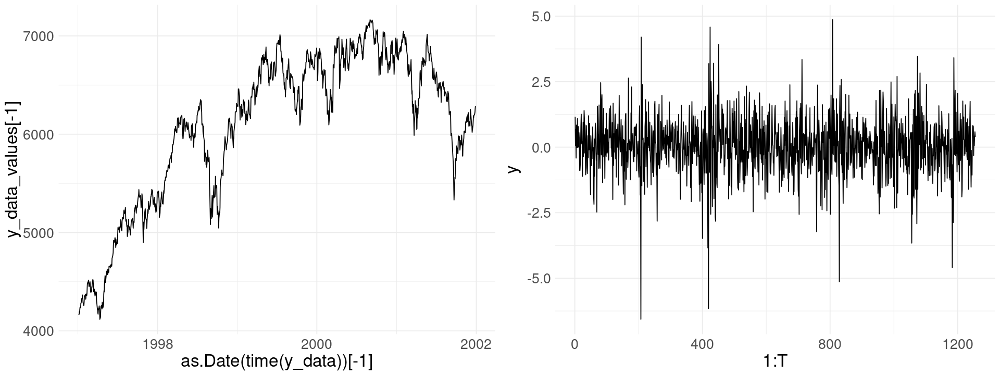

In [88]:
y <- ( (y_data_values - lag(y_data_values))/lag(y_data_values) )[-1] * 100
T <- length(y)

options(repr.plot.width=16, repr.plot.height=6)
g_data <- ggplot()+
    geom_line(aes(x = as.Date(time(y_data))[-1], y = y_data_values[-1]))
g_y <- ggplot()+
    geom_line(aes(x = 1:T, y = y))

plot_grid(g_data, g_y)

In [90]:
set.seed(121)

start <- Sys.time()
    fit_y <- fit_garch_ardia(y, niter = 10000, burnin = 5000)
elapsed_sample <- Sys.time() - start

thetas <- cbind(fit_y$alpha0, fit_y$alpha1, fit_y$beta)
hs <- fit_y$h
colnames(thetas) <- c("alpha0", "alpha1", "beta")

start <- Sys.time()
    div <- psi_divergences_cpp_parallel(thetas, hs, y, p = 1, q = 1, k_values = 1:T, verbose = FALSE)
elapsed_div <- Sys.time() - start

colnames(div) <- c("KL", "KL_rev", "J", "chi2", "chi2_rev", "chi2_sym", "L1", "H", "JS")
div <- as.data.frame(div)

cat("Time for the generation of posteriori samples:", elapsed_sample,"\n")
cat("Time for the divergence metrics computation:", elapsed_div)

Time for the generation of posteriori samples: 1.284924 
Time for the divergence metrics computation: 41.98381

In [91]:
fit_y$summary

,mean,median,sd,2.5%,25%,50%,75%,97.5%
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
alpha0,0.1151902,0.1139430,0.02009465,0.07912975,0.1010735,0.1139430,0.1277831,0.1592179
alpha1,0.1209172,0.1199021,0.01973748,0.08549402,0.1073563,0.1199021,0.1334091,0.1619642
beta,0.7838767,0.7843092,0.02331700,0.73484810,0.7682888,0.7843092,0.8000227,0.8279315


In [92]:
# Set the initial divergence to a low value (possible numeric problem)
div[1,] <- 0.001

In [93]:
q <- 0.8

q_y_KL <- quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_KL, q) %>% median
q_y_KL_rev <- quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_KL_rev, q) %>% median
q_y_J <- quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_J, q) %>% median
q_y_L1 <- quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_L1, q) %>% median
q_y_H <- quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_H, q) %>% median
q_y_JS <- quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_JS, q) %>% median

In [94]:
round(q_y_KL, 4)
round(q_y_KL_rev, 4)
round(q_y_J, 4)
round(q_y_L1, 4)
round(q_y_H, 4)
round(q_y_JS, 4)

[1] 0.1186

[1] 0.125

[1] 0.2438

[1] 0.1931

[1] 0.0299

[1] 0.0294

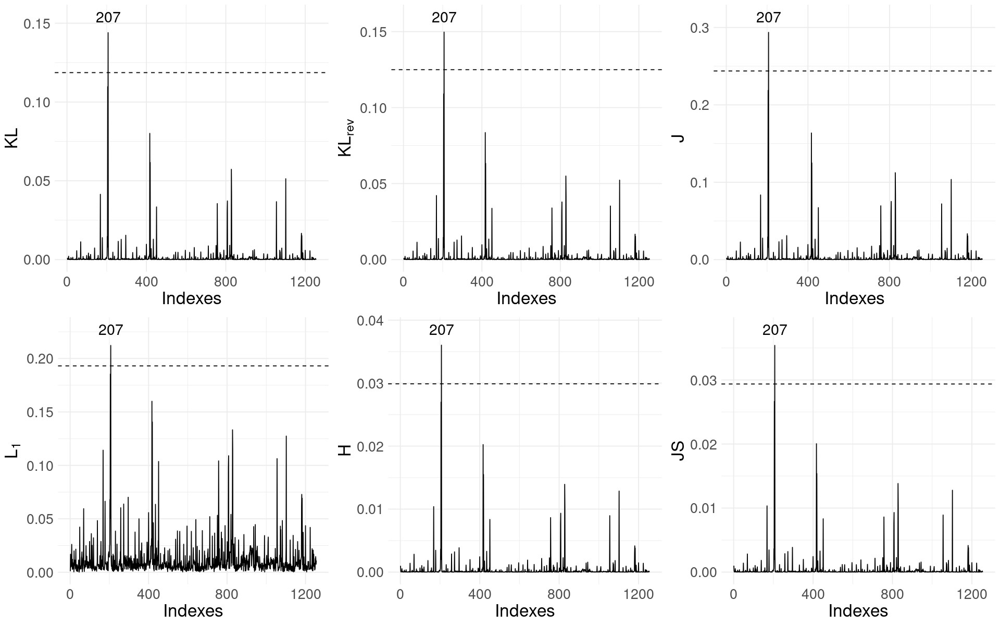

In [95]:
options(repr.plot.width=16, repr.plot.height=10)
g_KL <- ggplot()+
    geom_line(aes(x = 1:T, div$KL))+
    geom_hline(aes(yintercept = q_y_KL), linetype = "dashed")+
    geom_text(aes(x = 1:T, y = div$KL+0.01), label = ifelse(div$KL > q_y_KL, as.character(1:T), ""), size = 6)+
    labs(x = "Indexes", y = latex2exp::TeX("$KL$"))
g_KL_rev <- ggplot()+
    geom_line(aes(x = 1:T, div$KL_rev))+
    geom_hline(aes(yintercept = q_y_KL_rev), linetype = "dashed")+
    geom_text(aes(x = 1:T, y = div$KL_rev+0.01), label = ifelse(div$KL_rev > q_y_KL_rev, as.character(1:T), ""), size = 6)+
    labs(x = "Indexes", y = latex2exp::TeX("$KL_{rev}$"))
g_J <- ggplot()+
    geom_line(aes(x = 1:T, div$J))+
    geom_hline(aes(yintercept = q_y_J), linetype = "dashed")+
    geom_text(aes(x = 1:T, y = div$J+0.02), label = ifelse(div$J > q_y_J, as.character(1:T), ""), size = 6)+
    labs(x = "Indexes", y = latex2exp::TeX("$J$"))
g_L1 <- ggplot()+
    geom_line(aes(x = 1:T, div$L1))+
    geom_hline(aes(yintercept = q_y_L1), linetype = "dashed")+
    geom_text(aes(x = 1:T, y = div$L1+0.015), label = ifelse(div$L1 > q_y_L1, as.character(1:T), ""), size = 6)+
    labs(x = "Indexes", y = latex2exp::TeX("$L_1$"))
g_H <- ggplot()+
    geom_line(aes(x = 1:T, div$H))+
    geom_hline(aes(yintercept = q_y_H), linetype = "dashed")+
    geom_text(aes(x = 1:T, y = div$H+0.0025), label = ifelse(div$H > q_y_H, as.character(1:T), ""), size = 6)+
    labs(x = "Indexes", y = latex2exp::TeX("$H$"))
g_JS <- ggplot()+
    geom_line(aes(x = 1:T, div$JS))+
    geom_hline(aes(yintercept = q_y_JS), linetype = "dashed")+
    geom_text(aes(x = 1:T, y = div$JS+0.0025), label = ifelse(div$JS > q_y_JS, as.character(1:T), ""), size = 6)+
    labs(x = "Indexes", y = latex2exp::TeX("$JS$"))

plot_grid(g_KL, g_KL_rev, g_J, g_L1, g_H, g_JS, nrow = 2)

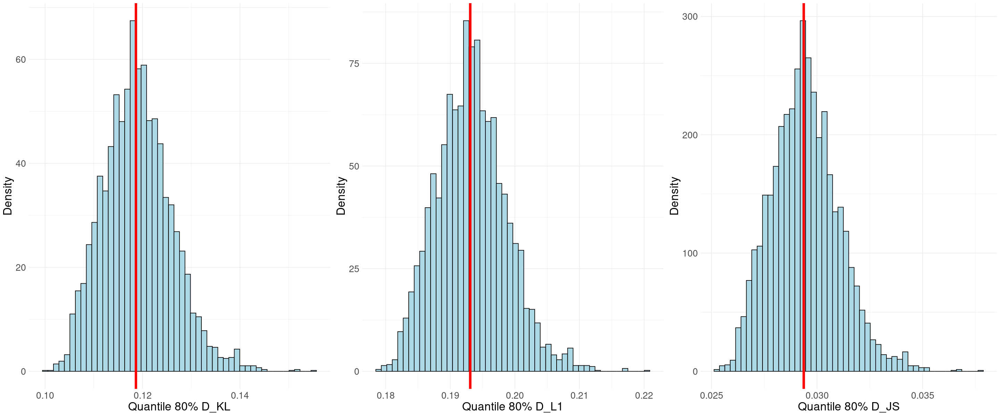

In [96]:
g_quantiles_KL <- ggplot()+
    geom_histogram(aes(x = quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_KL, q), y = after_stat(density)), bins = 50, color = "black", fill = "lightblue")+
    geom_vline(aes(xintercept = q_y_KL), color = "red", linewidth = 2) + labs(x = "Quantile 80% D_KL", y = "Density")
g_quantiles_L1 <- ggplot()+
    geom_histogram(aes(x = quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_L1, q), y = after_stat(density)), bins = 50, color = "black", fill = "lightblue")+
    geom_vline(aes(xintercept = q_y_L1), color = "red", linewidth = 2) + labs(x = "Quantile 80% D_L1", y = "Density")
g_quantiles_JS <- ggplot()+
    geom_histogram(aes(x = quantile_hat(fit_y$alpha1, fit_y$beta, gev_pars_fit_JS, q), y = after_stat(density)), bins = 50, color = "black", fill = "lightblue")+
    geom_vline(aes(xintercept = q_y_JS), color = "red", linewidth = 2) + labs(x = "Quantile 80% D_JS", y = "Density")

options(repr.plot.width=24, repr.plot.height=10)
plot_grid(g_quantiles_KL, g_quantiles_L1, g_quantiles_JS, nrow = 1)